# **1. LIBRARIES**

In [ ]:
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.regularizers import l2, l1_l2
from tensorflow.keras.models import Model npsoj pjsnoandsndmx
from tensorflow.keras.applications.resnet50 import ResNet50
import tensorflow as tf
import pandas as pd
from google.colab import drive
import zipfile
import os
from PIL import Image as PILImage
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keBras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, Callback
from transformers import ResNetForImageClassification
from transformers import ResNetConfig
import transformers
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from keras.models import load_model
from keras.preprocessing import image
import ipywidgets as widgets
from IPython.display import display, Image, clear_output
# from tensorflow.keras.preprocessing import image
from keras.applications.mobilenet_v2 import preprocess_input

# **2. DATA PREPROCESSING**

In [ ]:
# Parameter yang perlu disesuaikan
IMAGE_WIDTH = 224
IMAGE_HEIGHT = 224
NUM_CLASSES = 12  # Sesuaikan dengan jumlah kelas dalam dataset
BATCH_SIZE = 32
EPOCHS = 100

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#from google.colab import drive
#drive.mount("/content/drive")

with zipfile.ZipFile('/content/drive/MyDrive/tanaman.zip', 'r') as zip_ref:
    zip_ref.extractall('.')

# Mencari lokasi folder utama setelah ekstraksi
base_folder = "tanaman"

# Menyimpan images dan labels ke dalam list
images = []
labels = []

# Looping untuk membaca setiap file dalam subfolder
for folder in os.listdir(base_folder):
    folder_path = os.path.join(base_folder, folder)
    if os.path.isdir(folder_path):
        for image_file in os.listdir(folder_path):
            image_path = os.path.join(folder_path, image_file)
            image = PILImage.open(image_path).convert('RGB')
            image = np.asarray(image.resize((IMAGE_WIDTH, IMAGE_HEIGHT)))
            image = image / 255.0  # Normalisasi
            images.append(image)
            labels.append(folder)  # Folder name as label

# Menampilkan jumlah gambar dan label
len_images = len(images)
len_labels = len(labels)

print(f'images length: {len_images}')
print(f'labels length: {len_labels}')

images length: 1108
labels length: 1108


khusus juan![Architecture-of-EfficientNet-B0-with-MBConv-as-Basic-building-blocks.png](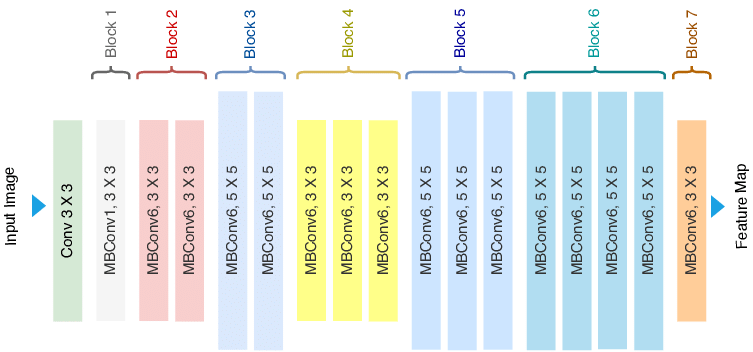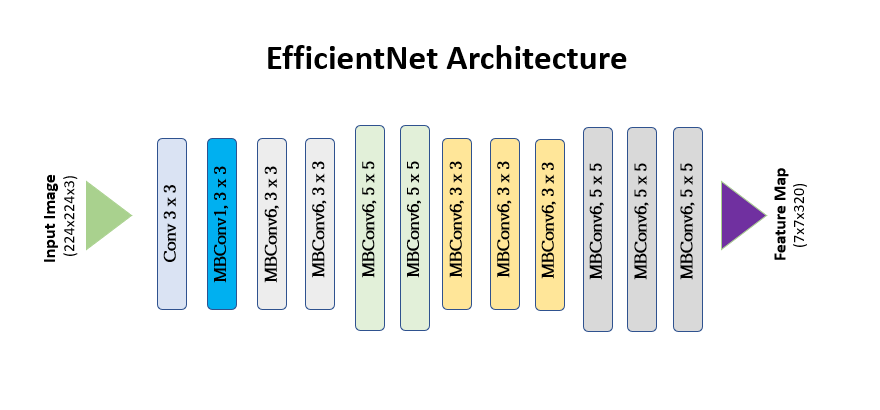)

In [ ]:
from PIL import Image
import os
import numpy as np
import zipfile

# Path to the zip file
zip_file_path = '/content/drive/MyDrive/tanaman.zip'

# Extract the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall('.')

# Set the base folder after extraction
base_folder = "tanaman"

# Lists to store images and labels
images = []
labels = []

# Loop through subfolders and read each image file
for folder in os.listdir(base_folder):
    folder_path = os.path.join(base_folder, folder)
    if os.path.isdir(folder_path):
        for image_file in os.listdir(folder_path):
            image_path = os.path.join(folder_path, image_file)
            with Image.open(image_path).convert('RGB') as image:
                image = np.asarray(image.resize((IMAGE_WIDTH, IMAGE_HEIGHT)))
                image = image / 255.0  # Normalization
                images.append(image)
                labels.append(folder)  # Folder name as label

# Display the number of images and labels
len_images = len(images)
len_labels = len(labels)

print(f'Images length: {len_images}')
print(f'Labels length: {len_labels}')


Images length: 1108
Labels length: 1108


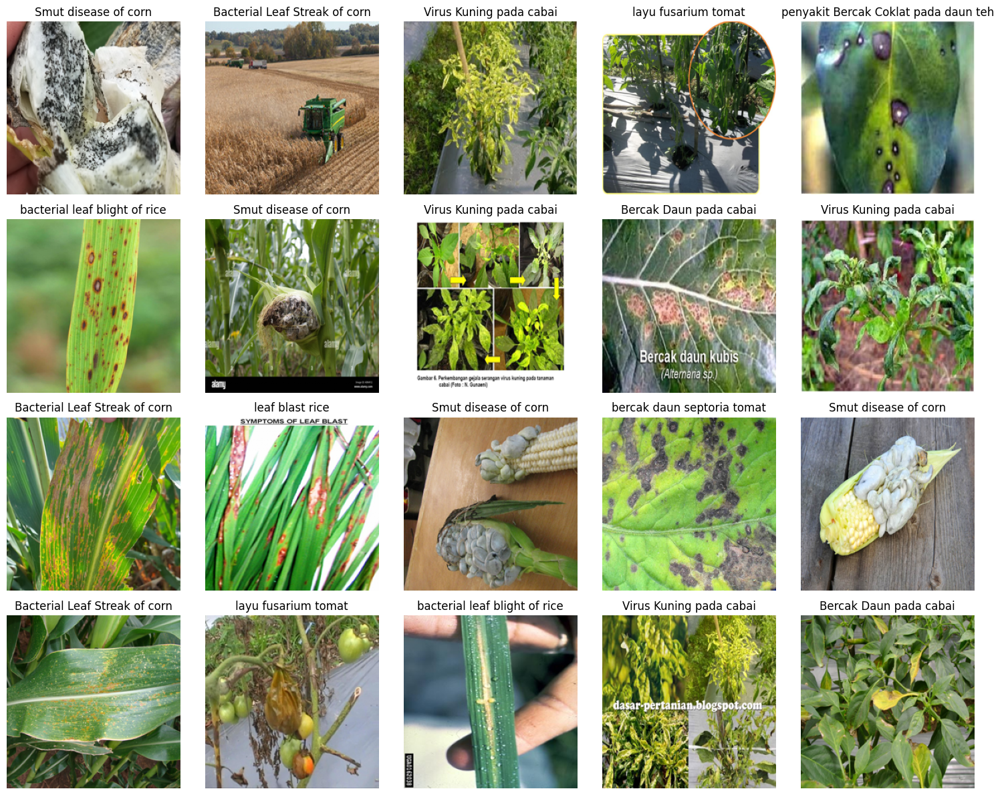

In [ ]:
def display_sample_images(images, labels, num_images):
    if num_images > len(images):
        print("Jumlah gambar yang diminta melebihi jumlah gambar dalam dataset")
        return

    # Pilih indeks gambar secara acak
    random_indices = np.random.choice(len(images), num_images, replace=False)

    # Pilih gambar dan label berdasarkan indeks acak
    # Menyesuaikan untuk list atau array Numpy
    selected_images = [images[i] for i in random_indices]
    selected_labels = [labels[i] for i in random_indices]

    # Hitung jumlah baris yang dibutuhkan untuk menampilkan semua gambar
    num_rows = num_images // 5 + int(num_images % 5 != 0)

    # Menyiapkan plot
    fig, axes = plt.subplots(num_rows, 5, figsize=(15, 3 * num_rows))
    axes = axes.ravel()

    for i in range(num_rows * 5):
        if i < num_images:
            axes[i].imshow(selected_images[i])
            axes[i].set_title(str(selected_labels[i]))  # Pastikan label adalah string
            axes[i].axis('off')
        else:
            axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# Menampilkan 20 contoh gambar secara acak
display_sample_images(images, labels, 20)


In [ ]:
uniquelabel = np.unique(labels)

label_to_int = {}  # Create a dictionary to map labels to integers

for i in range(len(uniquelabel)):
    replace = uniquelabel[i]
    label_to_int[replace] = i

print(label_to_int)

# Now, map the labels to integers using the dictionary
labels_as_int = [label_to_int[label] for label in labels]

{'Antraknosa pada cabai': 0, 'Bacterial Leaf Streak of corn': 1, 'Bercak Daun pada cabai': 2, 'Common Rust of corn': 3, 'Smut disease of corn': 4, 'Virus Kuning pada cabai': 5, 'bacterial leaf blight of rice': 6, 'bercak daun septoria tomat': 7, 'layu fusarium tomat': 8, 'leaf blast rice': 9, 'penyakit Bercak Coklat pada daun teh': 10, 'penyakit cacar daun pada daun teh': 11}


In [ ]:
one_hot_labels = to_categorical(labels_as_int, NUM_CLASSES)
print(one_hot_labels)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [ ]:
images=np.array(images)
labels=np.array(one_hot_labels)

X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)

# Mengecek shape/bentuk data
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(886, 224, 224, 3)
(222, 224, 224, 3)
(886, 12)
(222, 12)


In [ ]:
# Tentukan jumlah gambar yang ingin disimpan
num_images_to_save = 222

# Membuat direktori tempat menyimpan gambar (jika belum ada)
save_dir = '/content/drive/MyDrive/test_images/'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# Menyimpan gambar ke dalam direktori
for i in range(num_images_to_save):
    img = X_test[i]
    img = (img * 255).astype(np.uint8)  # Mengubah kembali ke format asli
    img = PILImage.fromarray(img)
    img.save(os.path.join(save_dir, f'test_image_{i}.jpg'))

print(f'{num_images_to_save} gambar telah disimpan di {save_dir}')

222 gambar telah disimpan di /content/drive/MyDrive/test_images/


In [ ]:
# Data augmentation untuk training set
train_datagen = ImageDataGenerator(
                                   rotation_range=20,
                                   zoom_range=0.2,
                                   width_shift_range = 0.2,
                                   height_shift_range = 0.2,
                                   shear_range=0.1,
                                   fill_mode="nearest"
                                   )

# Hanya rescale untuk validation set
val_datagen = ImageDataGenerator()

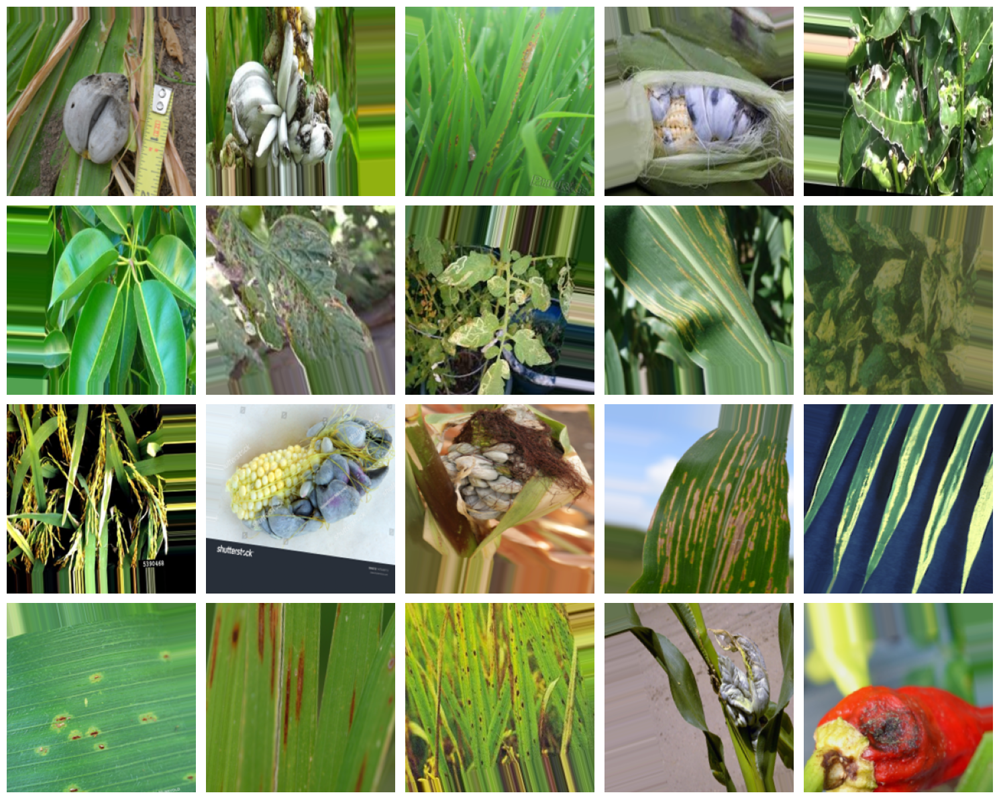

In [ ]:
def display_augmented_images_first_set(original_images, augmentor, num_images=20):
    if num_images > len(original_images):
        print("Jumlah gambar yang diminta melebihi jumlah gambar dalam dataset")
        return

    # Hitung jumlah baris yang dibutuhkan untuk menampilkan semua gambar
    num_rows = num_images // 5 + int(num_images % 5 != 0)

    # Menyiapkan plot
    fig, axes = plt.subplots(num_rows, 5, figsize=(15, 3 * num_rows))
    axes = axes.ravel()

    for i in range(num_rows * 5):
        if i < num_images:
            # Gambar yang telah diubah (augmented)
            augmented_image = next(augmentor.flow(np.expand_dims(original_images[i], 0)))[0]
            axes[i].imshow(augmented_image)
            axes[i].axis('off')
        else:
            axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# Menampilkan 20 contoh gambar yang telah diaugmentasi
display_augmented_images_first_set(X_train, train_datagen, num_images=20)


In [ ]:
# Flow data train dan data validation
train_generator = train_datagen.flow(
    X_train, y_train,
    batch_size=BATCH_SIZE
)

validation_generator = val_datagen.flow(
    X_test, y_test,
    batch_size=BATCH_SIZE
)

# **3. IMAGE CLASSIFICATION**

## **3.1 MobileNetV2**

In [ ]:
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, 3))

# Membuka lebih banyak layer untuk fine-tuning
for layer in base_model.layers[-60:]:
    layer.trainable = True

# Menambahkan regularisasi L2 pada layer Dense
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu', kernel_regularizer=l2(0.00001))(x)
x = Dropout(0.6)(x)
predictions = Dense(NUM_CLASSES, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)

# Kompilasi model dengan optimizer dan learning rate yang disesuaikan
model.compile(optimizer=Adam(learning_rate=1e-5), loss='categorical_crossentropy', metrics=['accuracy'])

# Custom Callback
class CustomCallback(Callback):
    def __init__(self, train_acc_threshold=0.75, val_acc_threshold=0.72):
        super(CustomCallback, self).__init__()
        self.train_acc_threshold = train_acc_threshold
        self.val_acc_threshold = val_acc_threshold

    def on_epoch_end(self, epoch, logs=None):
        train_acc = logs.get('accuracy')
        val_acc = logs.get('val_accuracy')
        if train_acc is not None and val_acc is not None:
            if train_acc >= self.train_acc_threshold and val_acc >= self.val_acc_threshold:
                print(f'\nMencapai {self.train_acc_threshold * 100}% akurasi training dan {self.val_acc_threshold * 100}% akurasi validation. Menghentikan training...')
                self.model.stop_training = True

custom_callback = CustomCallback(train_acc_threshold=0.75, val_acc_threshold=0.72)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3)

# Melanjutkan training model dengan parameter yang disesuaikan
history = model.fit(
    train_generator,
    steps_per_epoch=len(X_train) // BATCH_SIZE,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=len(X_test) // BATCH_SIZE,
    callbacks=[custom_callback, reduce_lr]
)

9406464/9406464 [==============================] - 1s 0us/step
Epoch 1/100
27/27 [==============================] - 52s 637ms/step - loss: 2.8845 - accuracy: 0.0960 - val_loss: 2.5587 - val_accuracy: 0.1146 - lr: 1.0000e-05
Epoch 2/100
27/27 [==============================] - 14s 511ms/step - loss: 2.6328 - accuracy: 0.1417 - val_loss: 2.4083 - val_accuracy: 0.1979 - lr: 1.0000e-05
Epoch 3/100
27/27 [==============================] - 14s 500ms/step - loss: 2.4458 - accuracy: 0.2119 - val_loss: 2.2442 - val_accuracy: 0.2344 - lr: 1.0000e-05
Epoch 4/100
27/27 [==============================] - 14s 505ms/step - loss: 2.3402 - accuracy: 0.2569 - val_loss: 2.1574 - val_accuracy: 0.2917 - lr: 1.0000e-05
Epoch 5/100
27/27 [==============================] - 13s 496ms/step - loss: 2.2547 - accuracy: 0.2600 - val_loss: 2.0405 - val_accuracy: 0.3490 - lr: 1.0000e-05
Epoch 6/100
27/27 [==============================] - 13s 495ms/step - loss: 2.1324 - accuracy: 0.3033 - val_loss: 1.9989 - val_accur

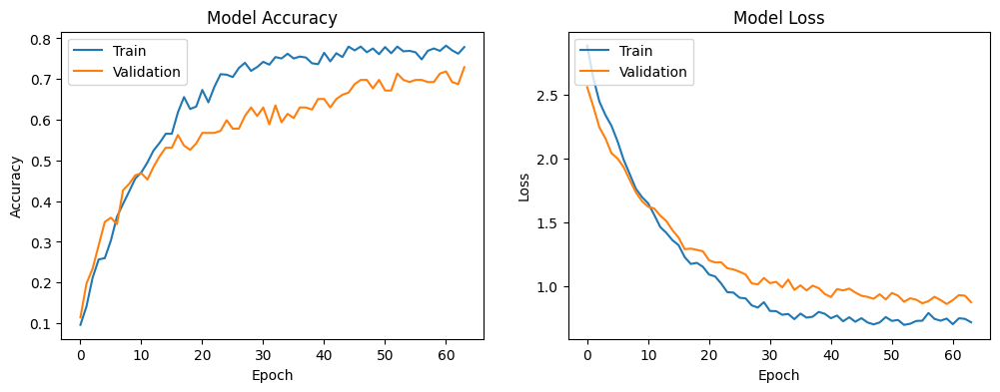

In [ ]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

7/7 [==============================] - 2s 247ms/step
Classification Report
                                      precision    recall  f1-score   support

               Antraknosa pada cabai       1.00      0.88      0.93        16
       Bacterial Leaf Streak of corn       1.00      0.78      0.88        23
              Bercak Daun pada cabai       0.40      0.32      0.35        19
                 Common Rust of corn       0.69      0.92      0.79        12
                Smut disease of corn       1.00      0.98      0.99        41
             Virus Kuning pada cabai       0.48      0.92      0.63        12
       bacterial leaf blight of rice       0.70      0.97      0.81        29
          bercak daun septoria tomat       0.56      0.50      0.53        10
                 layu fusarium tomat       0.50      0.20      0.29         5
                     leaf blast rice       1.00      0.59      0.74        17
penyakit Bercak Coklat pada daun teh       0.48      0.54      0.5

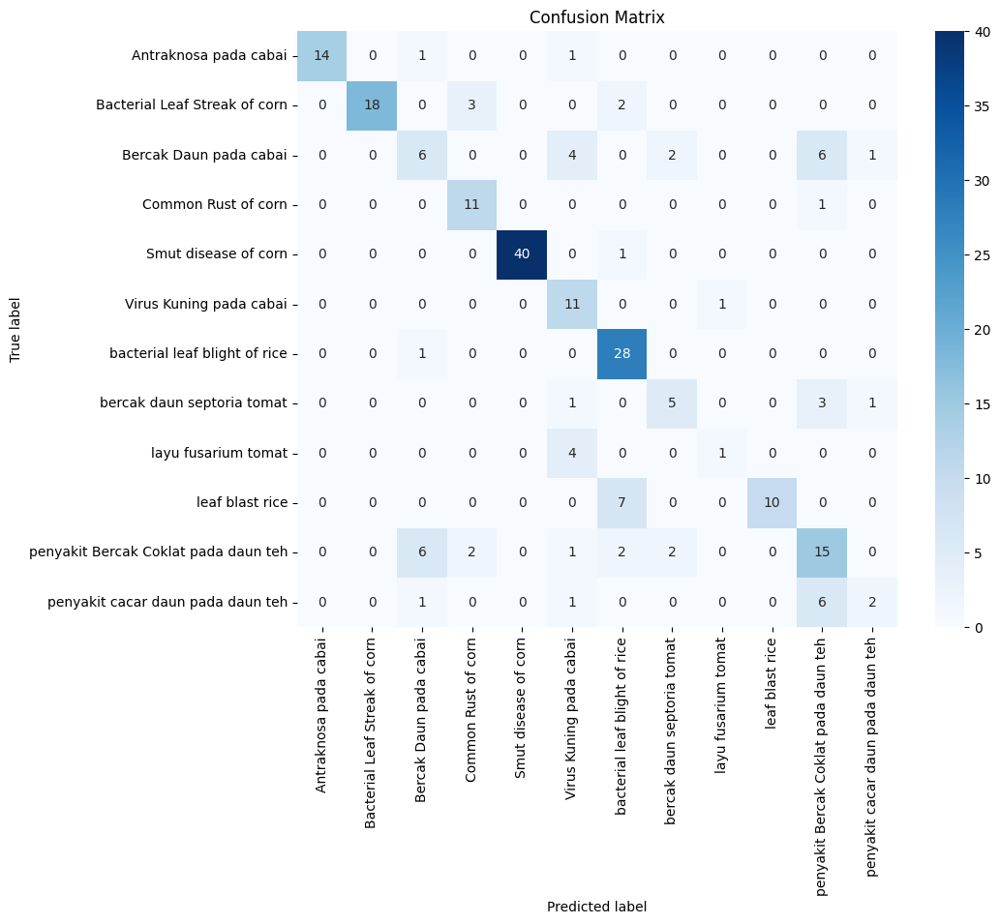

In [ ]:
# Membuat prediksi pada data test
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Classification report
print('Classification Report')
print(classification_report(y_true, y_pred_classes, target_names=uniquelabel))

# Confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues', xticklabels=uniquelabel, yticklabels=uniquelabel)
plt.title('Confusion Matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

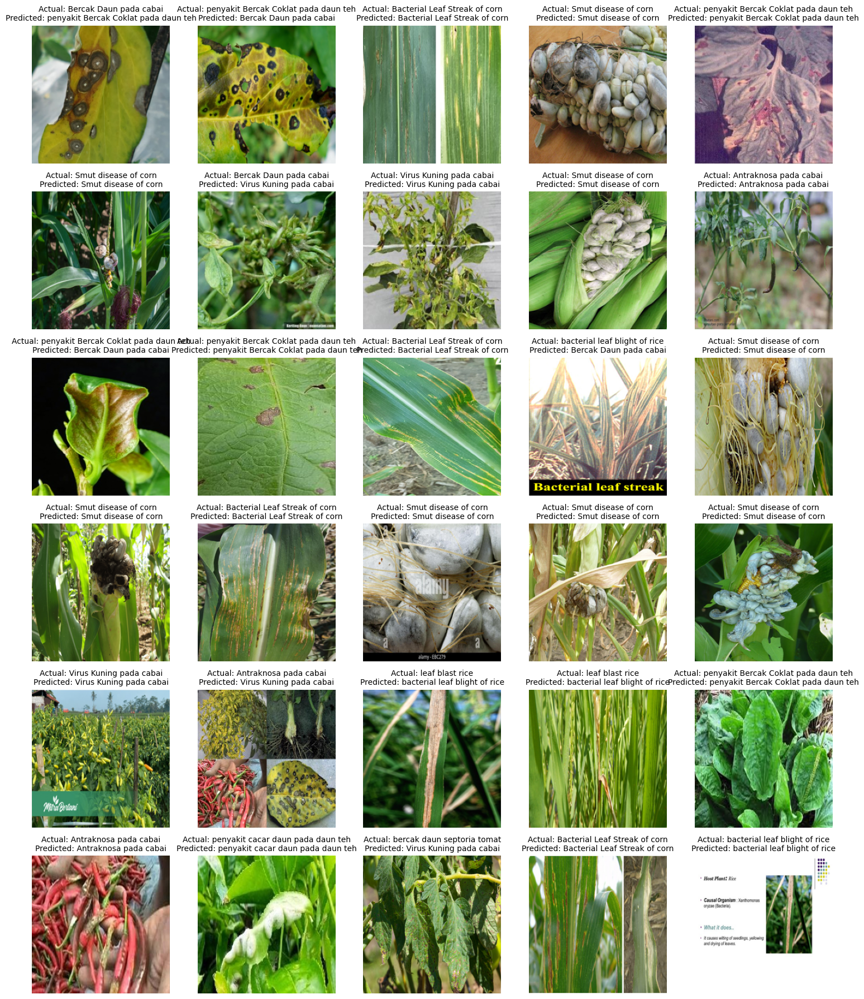

In [ ]:
# Fungsi untuk menampilkan beberapa contoh gambar dan prediksinya dengan format yang rapi
def display_predictions(images, true_labels, predicted_labels, num_images=20, num_columns=5):
    num_rows = num_images // num_columns + (num_images % num_columns > 0)
    plt.figure(figsize=(3 * num_columns, 3 * num_rows))  # Memperbesar ukuran figure

    for i in range(num_images):
        ax = plt.subplot(num_rows, num_columns, i+1)
        ax.imshow(images[i])
        ax.set_title(f'Actual: {true_labels[i]}\nPredicted: {predicted_labels[i]}', fontsize=10)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Mendapatkan label yang sesuai untuk true labels dan predicted labels
predicted_label_names = [uniquelabel[i] for i in y_pred_classes]
true_label_names = [uniquelabel[i] for i in y_true]

# Menampilkan prediksi pada 20 gambar acak dari test set
indices = np.random.choice(range(len(X_test)), 30, replace=False)
selected_images = X_test[indices]
selected_true_labels = [true_label_names[i] for i in indices]
selected_predicted_labels = [predicted_label_names[i] for i in indices]

display_predictions(selected_images, selected_true_labels, selected_predicted_labels, num_images=30)

In [ ]:
treatment_tanaman = pd.read_excel("/content/drive/MyDrive/penanganan_penyakit_tanaman.xlsx")
treatment_tanaman

,Penyakit,Penanganan
0,Antraknosa pada cabai,"Praktik sanitasi yang baik, termasuk pemangkas..."
1,Bacterial Leaf Streak of corn,Tidak disarankan untuk melakukan pemantauan ya...
2,Bercak Daun pada cabai,"Praktik sanitasi yang baik, termasuk pemangkas..."
3,Common Rust of corn,Perlu digunakan praktik pengendalian yang inte...
4,Smut disease of corn,Perlu dibantu dengan praktik pengendalian yang...
5,Virus Kuning pada cabai,"Penggunaan varietas tahan virus. Lalu, pengend..."
6,bacterial leaf blight of rice,Pengendalian dengan bakteri antagonis: Aplikas...
7,bercak daun septoria tomat,"Menjaga kebersihan taman dengan baik, rotasi t..."
8,layu fusarium tomat,"Menggunakan varietas tahan, memperbaiki pH tan..."
9,leaf blast rice,Pengendalian dengan fungisida: Aplikasi fungis...


In [ ]:
# Menghitung jumlah prediksi yang benar untuk setiap label
correct_predict_every_label = cm.diagonal()

# Menambahkan jumlah benar ke dataframe penanganan
treatment_tanaman['Correct Predict'] = correct_predict_every_label

treatment_tanaman

,Penyakit,Penanganan,Correct Predict
0,Antraknosa pada cabai,"Praktik sanitasi yang baik, termasuk pemangkas...",14
1,Bacterial Leaf Streak of corn,Tidak disarankan untuk melakukan pemantauan ya...,18
2,Bercak Daun pada cabai,"Praktik sanitasi yang baik, termasuk pemangkas...",6
3,Common Rust of corn,Perlu digunakan praktik pengendalian yang inte...,11
4,Smut disease of corn,Perlu dibantu dengan praktik pengendalian yang...,40
5,Virus Kuning pada cabai,"Penggunaan varietas tahan virus. Lalu, pengend...",11
6,bacterial leaf blight of rice,Pengendalian dengan bakteri antagonis: Aplikas...,28
7,bercak daun septoria tomat,"Menjaga kebersihan taman dengan baik, rotasi t...",5
8,layu fusarium tomat,"Menggunakan varietas tahan, memperbaiki pH tan...",1
9,leaf blast rice,Pengendalian dengan fungisida: Aplikasi fungis...,10


In [ ]:
# Simpan model
model.save('/content/drive/MyDrive/mobilenetv2_tanaman.h5')

### **3.1.1 MobileNetV2 Prediction**

In [ ]:
from tensorflow.keras.models import load_model

# Load the saved model
model = load_model('/content/drive/MyDrive/mobilenetv2_tanaman.h5')

# Now you can use the loaded_model for predictions or further training

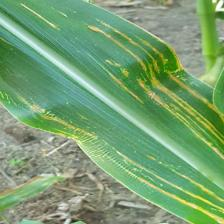

NameError: ignored

In [ ]:
treatments = dict(zip(treatment_tanaman['Penyakit'], treatment_tanaman['Penanganan']))

# Fungsi untuk memproses dan memprediksi gambar
def process_and_predict_image(img_path):
    # Memuat dan memproses gambar
    img = image.load_img(img_path, target_size=(224, 224))
    img_tensor = image.img_to_array(img)  # Mengubah gambar menjadi tensor
    img_tensor = np.expand_dims(img_tensor, axis=0)  # Menambahkan dimensi batch
    img_tensor /= 255.0  # Normalisasi

    # Prediksi gambar menggunakan model
    prediction = model.predict(img_tensor)
    predicted_class = np.argmax(prediction[0])

    # Mendapatkan label kelas berdasarkan indeks
    for label, index in label_to_int.items():
        if index == predicted_class:
            predicted_label = label
            break

    probability = np.max(prediction[0])

    return predicted_label, probability

# Fungsi untuk mereset dan menampilkan ulang tombol unggah
def reset_upload_button():
    upload.value.clear()  # Menghapus file yang sebelumnya diunggah
    display(upload)  # Menampilkan kembali tombol unggah

# Fungsi callback untuk tombol unggah
def on_upload_change(change):
    if change['type'] == 'change' and change['name'] == 'value':
        clear_output(wait=True)  # Bersihkan output sebelumnya

        # Process each uploaded file
        for filename, file_info in upload.value.items():
            # Menyimpan file sementara
            with open(filename, "wb") as f:
                f.write(file_info['content'])

            # Menampilkan gambar yang diunggah
            display(Image(filename))

            # Melakukan prediksi pada gambar yang diunggah
            predicted_label, confidence = process_and_predict_image(filename)
            print(f"Prediksi untuk {filename}:")
            print("Prediksi Penyakit Tanaman:", predicted_label)
            print("Probability:", confidence)
            print("\n---------------------------------------\n")

            # Display the treatment information if available
            treatment = treatments.get(predicted_label, 'No treatment information available')
            print(f"Treatment: {treatment}")
            print("\n---------------------------------------\n")

        # Reset tombol unggah untuk pengunggahan berikutnya
        reset_upload_button()

# Membuat tombol unggah dengan multiple=True untuk mengizinkan banyak file
upload = widgets.FileUpload(multiple=True)
upload.observe(on_upload_change, names='value')

# Menampilkan tombol unggah
display(upload)

## **3.2 VGG16**

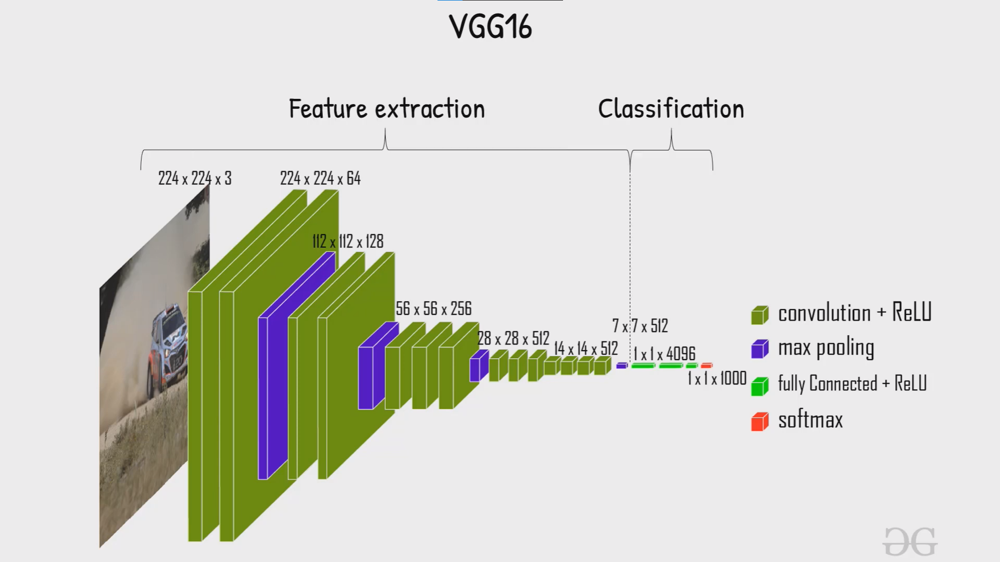

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

In [ ]:
BATCH_SIZE = 32
EPOCHS = 100

In [ ]:
# Flow data train dan data validation
train_generator = train_datagen.flow(
    X_train, y_train,
    batch_size=BATCH_SIZE
)

validation_generator = val_datagen.flow(
    X_test, y_test,
    batch_size=BATCH_SIZE
)

In [ ]:
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, 3))

# Membuka lebih banyak layer untuk fine-tuning
for layer in base_model.layers[-60:]:
    layer.trainable = True

# Menambahkan regularisasi L2 pada layer Dense
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu', kernel_regularizer=l2(0.001))(x)
x = Dropout(0.6)(x)
predictions = Dense(NUM_CLASSES, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)

# Kompilasi model dengan optimizer dan learning rate yang disesuaikan
model.compile(optimizer=Adam(learning_rate=0.00001), loss='categorical_crossentropy', metrics=['accuracy'])

# Custom Callback
class CustomCallback(Callback):
    def __init__(self, train_acc_threshold=0.85, val_acc_threshold=0.85):
        super(CustomCallback, self).__init__()
        self.train_acc_threshold = train_acc_threshold
        self.val_acc_threshold = val_acc_threshold

    def on_epoch_end(self, epoch, logs=None):
        train_acc = logs.get('accuracy')
        val_acc = logs.get('val_accuracy')
        if train_acc is not None and val_acc is not None:
            if train_acc >= self.train_acc_threshold and val_acc >= self.val_acc_threshold:
                print(f'\nMencapai {self.train_acc_threshold * 100}% akurasi training dan {self.val_acc_threshold * 100}% akurasi validation. Menghentikan training...')
                self.model.stop_training = True

custom_callback = CustomCallback(train_acc_threshold=0.75, val_acc_threshold=0.72)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5)

# Melanjutkan training model dengan parameter yang disesuaikan
history = model.fit(
    train_generator,
    steps_per_epoch=len(X_train) // BATCH_SIZE,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=len(X_test) // BATCH_SIZE,
    callbacks=[custom_callback, reduce_lr]
)

Epoch 1/100
 6/27 [=====>........................] - ETA: 10s - loss: 3.4186 - accuracy: 0.0938

27/27 [==============================] - 20s 575ms/step - loss: 3.2699 - accuracy: 0.1265 - val_loss: 2.9345 - val_accuracy: 0.2448 - lr: 1.0000e-05
Epoch 2/100
27/27 [==============================] - 15s 561ms/step - loss: 3.0142 - accuracy: 0.2283 - val_loss: 2.7414 - val_accuracy: 0.2917 - lr: 1.0000e-05
Epoch 3/100
27/27 [==============================] - 16s 585ms/step - loss: 2.7916 - accuracy: 0.3044 - val_loss: 2.5414 - val_accuracy: 0.3542 - lr: 1.0000e-05
Epoch 4/100
27/27 [==============================] - 16s 588ms/step - loss: 2.5979 - accuracy: 0.3560 - val_loss: 2.4297 - val_accuracy: 0.4635 - lr: 1.0000e-05
Epoch 5/100
27/27 [==============================] - 16s 595ms/step - loss: 2.3972 - accuracy: 0.4379 - val_loss: 2.1644 - val_accuracy: 0.4896 - lr: 1.0000e-05
Epoch 6/100
27/27 [==============================] - 15s 565ms/step - loss: 2.2063 - accuracy: 0.4906 - val_loss: 2.0551 - val_accuracy: 0.5677 - lr: 1.0000e-05
Epoch 7/100
27/27 [===========================

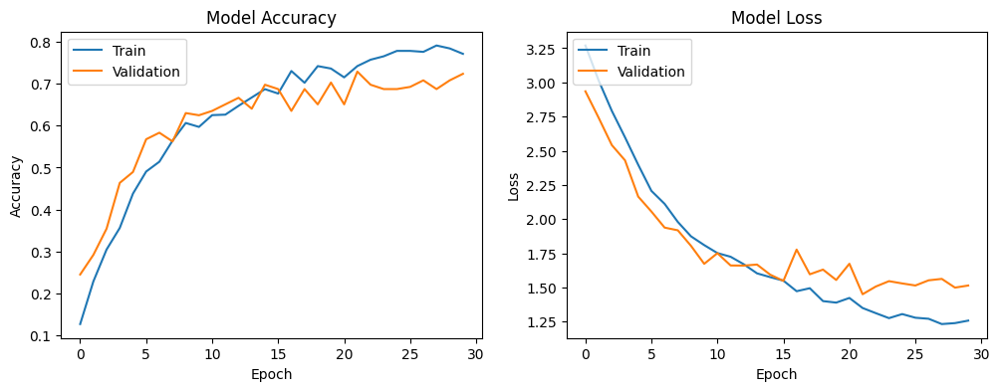

In [ ]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

7/7 [==============================] - 1s 133ms/step
Classification Report
                                      precision    recall  f1-score   support

               Antraknosa pada cabai       0.60      0.75      0.67        16
       Bacterial Leaf Streak of corn       0.91      0.87      0.89        23
              Bercak Daun pada cabai       0.54      0.37      0.44        19
                 Common Rust of corn       0.83      0.83      0.83        12
                Smut disease of corn       0.91      1.00      0.95        41
             Virus Kuning pada cabai       0.69      0.92      0.79        12
       bacterial leaf blight of rice       0.79      0.79      0.79        29
          bercak daun septoria tomat       0.46      0.60      0.52        10
                 layu fusarium tomat       0.57      0.80      0.67         5
                     leaf blast rice       0.73      0.65      0.69        17
penyakit Bercak Coklat pada daun teh       0.44      0.39      0.4

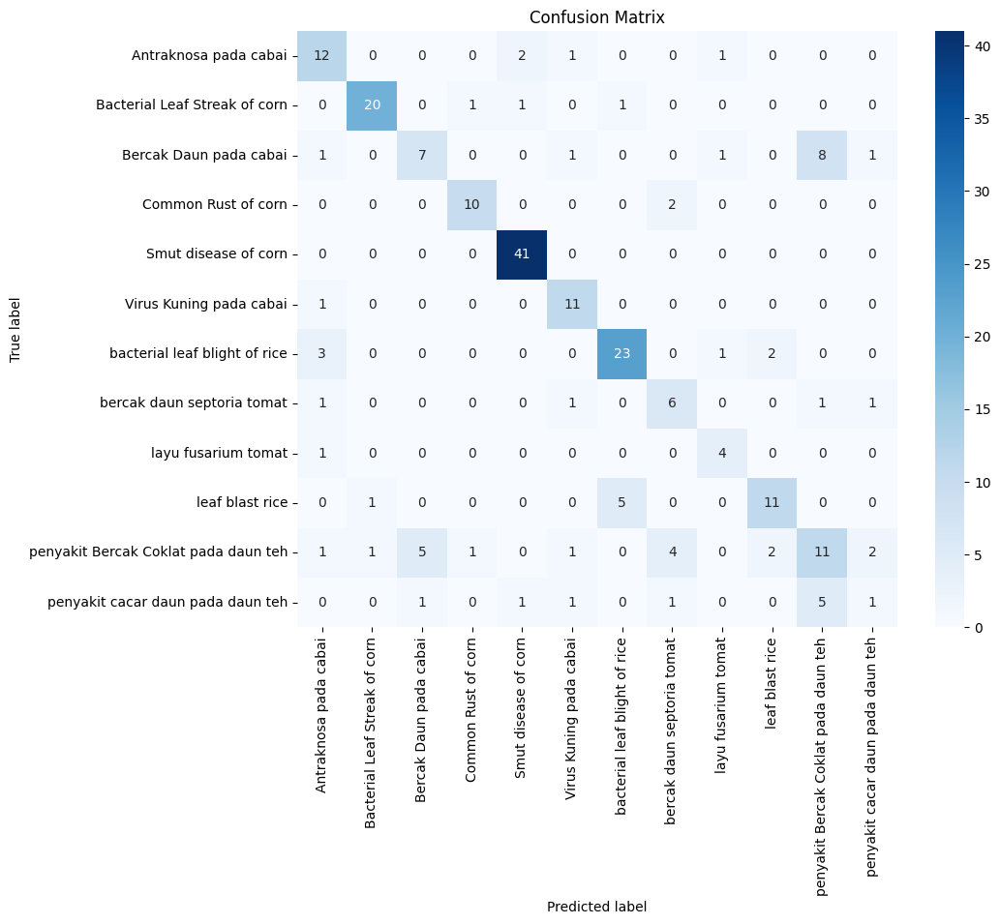

In [ ]:
# Membuat prediksi pada data test
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Classification report
print('Classification Report')
print(classification_report(y_true, y_pred_classes, target_names=uniquelabel))

# Confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues', xticklabels=uniquelabel, yticklabels=uniquelabel)
plt.title('Confusion Matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

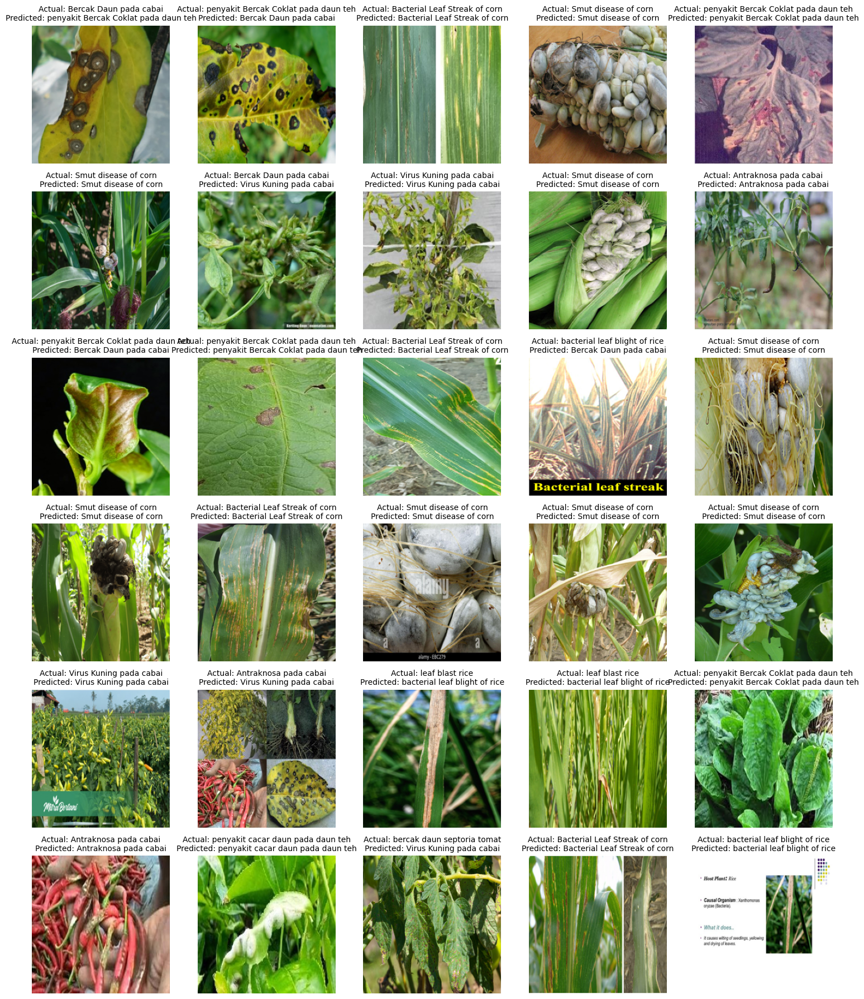

In [ ]:
# Fungsi untuk menampilkan beberapa contoh gambar dan prediksinya dengan format yang rapi
def display_predictions(images, true_labels, predicted_labels, num_images=20, num_columns=5):
    num_rows = num_images // num_columns + (num_images % num_columns > 0)
    plt.figure(figsize=(3 * num_columns, 3 * num_rows))  # Memperbesar ukuran figure

    for i in range(num_images):
        ax = plt.subplot(num_rows, num_columns, i+1)
        ax.imshow(images[i])
        ax.set_title(f'Actual: {true_labels[i]}\nPredicted: {predicted_labels[i]}', fontsize=10)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

# Mendapatkan label yang sesuai untuk true labels dan predicted labels
predicted_label_names = [uniquelabel[i] for i in y_pred_classes]
true_label_names = [uniquelabel[i] for i in y_true]

# Menampilkan prediksi pada 20 gambar acak dari test set
indices = np.random.choice(range(len(X_test)), 30, replace=False)
selected_images = X_test[indices]
selected_true_labels = [true_label_names[i] for i in indices]
selected_predicted_labels = [predicted_label_names[i] for i in indices]

display_predictions(selected_images, selected_true_labels, selected_predicted_labels, num_images=30)

## 3.3 EfficientNet

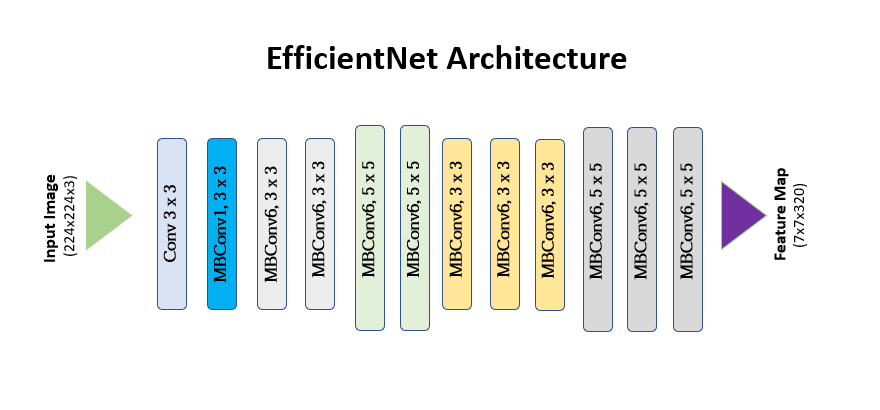

In [ ]:
pip install efficientnet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 959.5 kB/s eta 0:00:00


In [ ]:
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import Callback, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
from efficientnet.tfkeras import preprocess_input

In [ ]:
# Load EfficientNetB0 as the base model
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(IMAGE_WIDTH, IMAGE_HEIGHT, 3))

In [ ]:
# Open more layers for fine-tuning
for layer in base_model.layers[-60:]:
    layer.trainable = True

In [ ]:
# Add L2 regularization to the Dense layer
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu', kernel_regularizer=l2(0.00001))(x)
x = Dropout(0.6)(x)
predictions = Dense(NUM_CLASSES, activation='softmax')(x)
model = Model(inputs=base_model.input, outputs=predictions)

In [ ]:
# Compile the model with the optimizer and adjusted learning rate
model.compile(optimizer=Adam(learning_rate=1e-5), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# Custom Callback
class CustomCallback(Callback):
    def __init__(self, train_acc_threshold=0.75, val_acc_threshold=0.72):
        super(CustomCallback, self).__init__()
        self.train_acc_threshold = train_acc_threshold
        self.val_acc_threshold = val_acc_threshold

    def on_epoch_end(self, epoch, logs=None):
        train_acc = logs.get('accuracy')
        val_acc = logs.get('val_accuracy')
        if train_acc is not None and val_acc is not None:
            if train_acc >= self.train_acc_threshold and val_acc >= self.val_acc_threshold:
                print(f'\nReached {self.train_acc_threshold * 100}% training accuracy and {self.val_acc_threshold * 100}% validation accuracy. Stopping training...')
                self.model.stop_training = True

In [ ]:
custom_callback = CustomCallback(train_acc_threshold=0.75, val_acc_threshold=0.72)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3)

In [ ]:
# Continue training the model with adjusted parameters
history = model.fit(
    train_generator,
    steps_per_epoch=len(X_train) // BATCH_SIZE,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=len(X_test) // BATCH_SIZE,
    callbacks=[custom_callback, reduce_lr]
)

Epoch 1/100
27/27 [==============================] - 71s 605ms/step - loss: 2.5184 - accuracy: 0.0902 - val_loss: 2.5000 - val_accuracy: 0.1458 - lr: 1.0000e-05
Epoch 2/100
27/27 [==============================] - 14s 511ms/step - loss: 2.4261 - accuracy: 0.1616 - val_loss: 2.4849 - val_accuracy: 0.1562 - lr: 1.0000e-05
Epoch 3/100
27/27 [==============================] - 15s 538ms/step - loss: 2.3689 - accuracy: 0.1991 - val_loss: 2.4876 - val_accuracy: 0.0938 - lr: 1.0000e-05
Epoch 4/100
27/27 [==============================] - 15s 564ms/step - loss: 2.3043 - accuracy: 0.2518 - val_loss: 2.4891 - val_accuracy: 0.1146 - lr: 1.0000e-05
Epoch 5/100
27/27 [==============================] - 14s 521ms/step - loss: 2.2540 - accuracy: 0.2529 - val_loss: 2.4779 - val_accuracy: 0.1667 - lr: 1.0000e-05
Epoch 6/100
27/27 [==============================] - 13s 493ms/step - loss: 2.2064 - accuracy: 0.2740 - val_loss: 2.4699 - val_accuracy: 0.1875 - lr: 1.0000e-05
Epoch 7/100
27/27 [===============

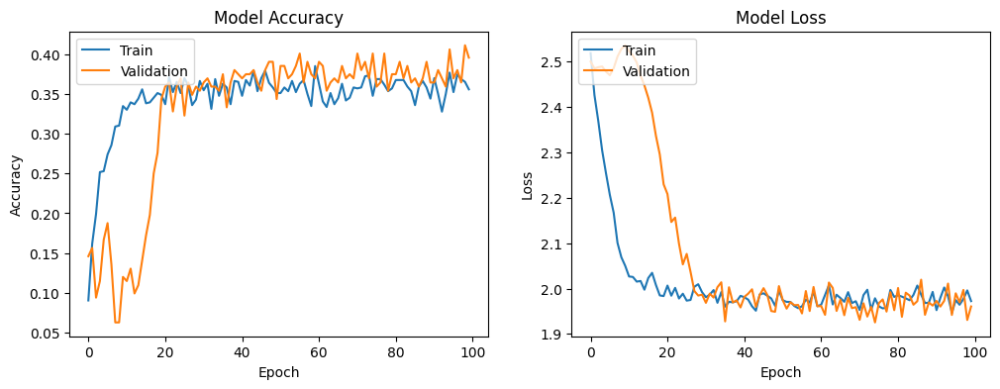

In [ ]:
# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

7/7 [==============================] - 4s 333ms/step
Classification Report
                                      precision    recall  f1-score   support

               Antraknosa pada cabai       0.56      0.31      0.40        16
       Bacterial Leaf Streak of corn       0.50      0.26      0.34        23
              Bercak Daun pada cabai       0.00      0.00      0.00        19
                 Common Rust of corn       0.00      0.00      0.00        12
                Smut disease of corn       0.39      0.95      0.55        41
             Virus Kuning pada cabai       0.25      0.08      0.12        12
       bacterial leaf blight of rice       0.45      0.83      0.59        29
          bercak daun septoria tomat       0.00      0.00      0.00        10
                 layu fusarium tomat       0.33      0.20      0.25         5
                     leaf blast rice       1.00      0.29      0.45        17
penyakit Bercak Coklat pada daun teh       0.21      0.11      0.1

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


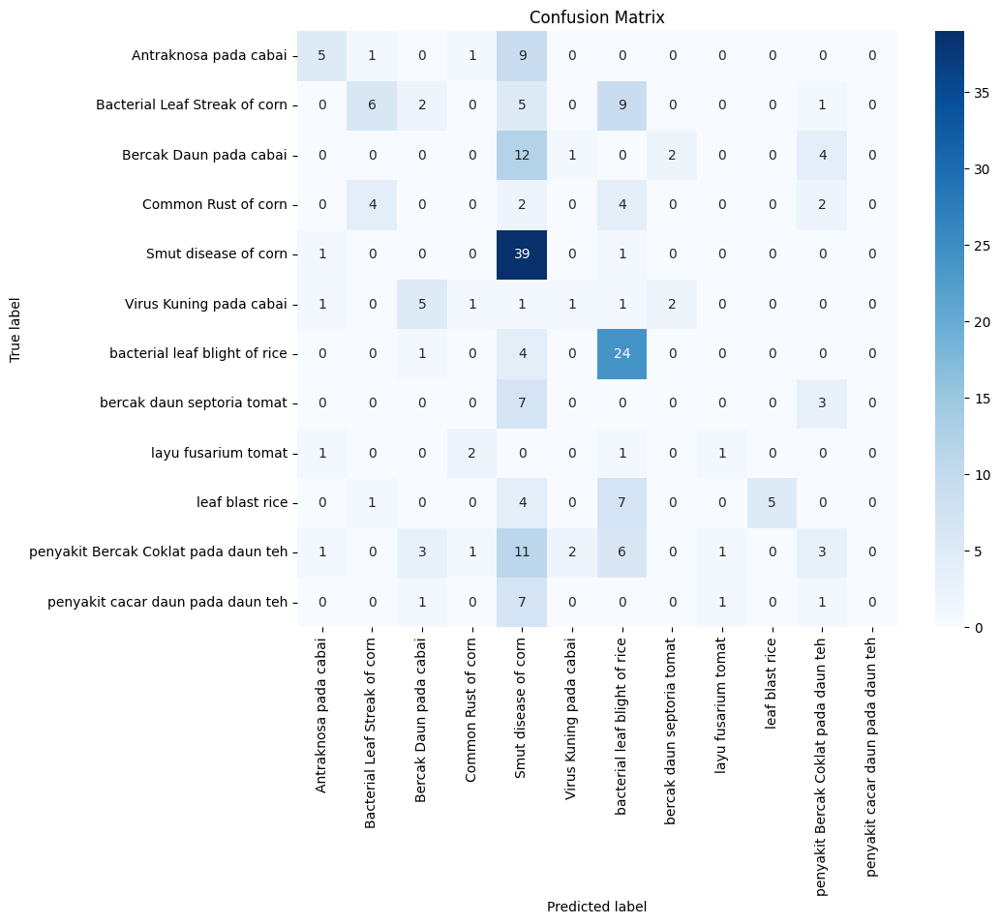

In [ ]:
# Membuat prediksi pada data test
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = np.argmax(y_test, axis=1)

# Classification report
print('Classification Report')
print(classification_report(y_true, y_pred_classes, target_names=uniquelabel))

# Confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt="d", cmap='Blues', xticklabels=uniquelabel, yticklabels=uniquelabel)
plt.title('Confusion Matrix')
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

## **3.4 ResNet50**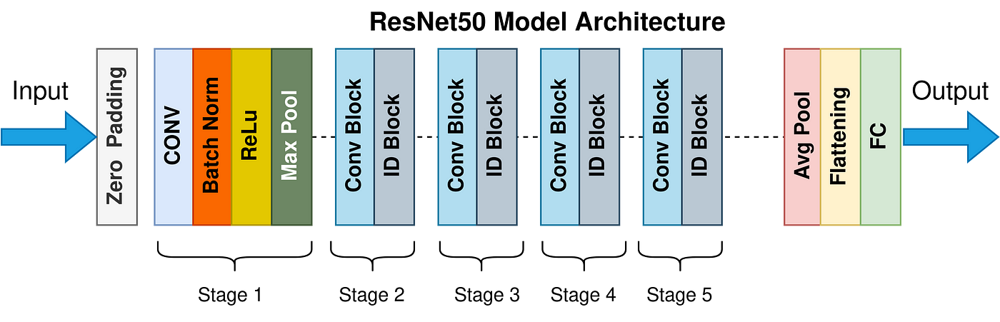

In [ ]:
# Import The Libraries

from tensorflow.keras.layers import Input, Lambda, Dense, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
from tensorflow.keras.models import Sequential

import numpy as np
from glob import glob
import matplotlib.pyplot as plt

In [ ]:
# Paths
train_Path = '/content/drive/MyDrive/dataset_tanaman/train'
test_Path = '/content/drive/MyDrive/dataset_tanaman/val'

In [ ]:
# Set Resize variable
IMAGE_SIZE = [224, 224] # This is my desired image size... and also ResNet50 accepts image of 224*224.

In [ ]:
resnet = ResNet50(
    input_shape = IMAGE_SIZE + [3], # Making the image into 3 Channel, so concating 3.
    weights = 'imagenet', # Default weights.
    include_top = False   #
)

In [ ]:
resnet.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_4[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                       

In [ ]:
for layer in resnet.layers:
    layer.trainable = False

# This will let us use the default weights used by the imagenet.

In [ ]:
# Usefule for getting number of output classes.
folders = glob(train_Path + '/*')
folders

['/content/drive/MyDrive/dataset_tanaman/train/penyakit_cacar_daun_daun_teh',
 '/content/drive/MyDrive/dataset_tanaman/train/penyakit_bercak_coklat_daun_teh',
 '/content/drive/MyDrive/dataset_tanaman/train/bacterial_leaf_streak_corn',
 '/content/drive/MyDrive/dataset_tanaman/train/bercak_daun_cabai',
 '/content/drive/MyDrive/dataset_tanaman/train/bercak_daun_septoria_tomat',
 '/content/drive/MyDrive/dataset_tanaman/train/common_rust_corn',
 '/content/drive/MyDrive/dataset_tanaman/train/leaf_blast_rice',
 '/content/drive/MyDrive/dataset_tanaman/train/smut_disease_corn',
 '/content/drive/MyDrive/dataset_tanaman/train/virus_kuning_cabai',
 '/content/drive/MyDrive/dataset_tanaman/train/layu_fusarium_tomat',
 '/content/drive/MyDrive/dataset_tanaman/train/antraknosa_cabai',
 '/content/drive/MyDrive/dataset_tanaman/train/bacterial_leaf_blight_rice']

In [ ]:
diseases_label = [
    'penyakit_cacar_daun_daun_teh',
    'bacterial_leaf_streak_corn',
    'bercak_daun_cabai',
    'penyakit_bercak_coklat_daun_teh',
    'bercak_daun_septoria_tomat',
    'common_rust_corn',
    'leaf_blast_rice',
    'smut_disease_corn',
    'virus_kuning_cabai',
    'layu_fusarium_tomat',
    'antraknosa_cabai',
    'bacterial_leaf_blight_rice'
]

In [ ]:
# Set the flatten layer.
x = Flatten() (resnet.output)

In [ ]:
prediction = Dense(len(folders), activation = 'softmax')(x)

In [ ]:
# Create a model Object
model = Model(inputs = resnet.input, outputs = prediction)

In [ ]:
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_4[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                                                                        

In [ ]:
model.compile (
    loss = 'categorical_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy']
)

In [ ]:
train_datagen = ImageDataGenerator(
    rescale = 1./255,
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True
)

test_datagen = ImageDataGenerator(
    rescale = 1./255
)

In [ ]:
training_set = train_datagen.flow_from_directory(
    train_Path,
    target_size = IMAGE_SIZE,
    batch_size = 32,
    class_mode = 'categorical' # As we have more than 2 so using categorical.. for 2 we might have used binary.
)

Found 852 images belonging to 12 classes.


In [ ]:
test_set = train_datagen.flow_from_directory(
    test_Path,
    target_size = IMAGE_SIZE,
    batch_size = 32,
    class_mode = 'categorical'
)

Found 222 images belonging to 12 classes.


In [ ]:
# Fir the model.

history = model.fit_generator(
    training_set,
    validation_data = test_set,
    epochs = 50,
    steps_per_epoch = len(training_set),
    validation_steps = len(test_set)
)

<ipython-input-47-bfda80586abe>:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(


Epoch 1/50
27/27 [==============================] - 785s 29s/step - loss: 9.1369 - accuracy: 0.1373 - val_loss: 6.0764 - val_accuracy: 0.1441
Epoch 2/50
27/27 [==============================] - 26s 963ms/step - loss: 4.6867 - accuracy: 0.1901 - val_loss: 3.9082 - val_accuracy: 0.1982
Epoch 3/50
27/27 [==============================] - 26s 954ms/step - loss: 2.7514 - accuracy: 0.2547 - val_loss: 2.7021 - val_accuracy: 0.1261
Epoch 4/50
27/27 [==============================] - 28s 1s/step - loss: 2.3016 - accuracy: 0.2782 - val_loss: 2.4875 - val_accuracy: 0.2342
Epoch 5/50
27/27 [==============================] - 24s 887ms/step - loss: 2.4350 - accuracy: 0.3016 - val_loss: 2.5398 - val_accuracy: 0.1937
Epoch 6/50
27/27 [==============================] - 26s 950ms/step - loss: 2.1570 - accuracy: 0.3462 - val_loss: 2.3752 - val_accuracy: 0.3018
Epoch 7/50
27/27 [==============================] - 25s 948ms/step - loss: 2.2242 - accuracy: 0.3369 - val_loss: 2.8924 - val_accuracy: 0.2252
Epo

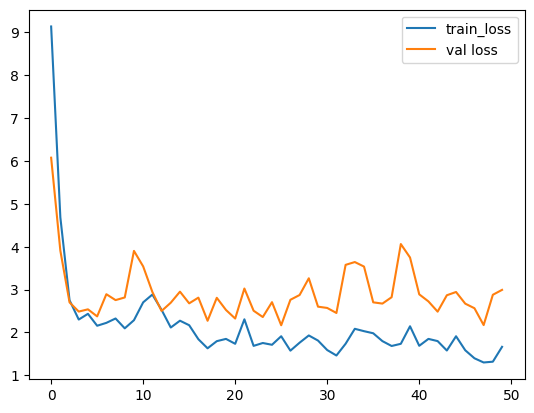

In [ ]:
# Plot the Loss

plt.plot(history.history['loss'], label = 'train_loss')
plt.plot(history.history['val_loss'], label ='val loss')
plt.legend()
plt.show()
# plt.savefig('LossVal_loss')

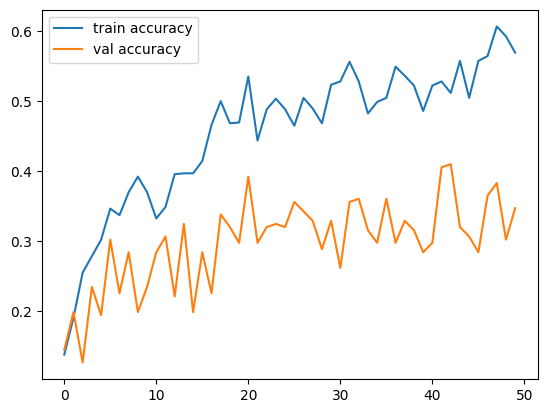

In [ ]:
# Plot the Accuracy
plt.plot(history.history['accuracy'], label = 'train accuracy')
plt.plot(history.history['val_accuracy'], label ='val accuracy')
plt.legend()
plt.show()
# plt.savefig('valAccuracy')

In [ ]:
# Save it as a h5 file
from tensorflow.keras.models import load_model

model.save('car_brand_clf_resnet50.h5')

In [ ]:
prediction = model.predict(test_set)

7/7 [==============================] - 6s 629ms/step


In [ ]:
prediction

array([[1.50783762e-01, 5.33267972e-04, 1.07113319e-02, ...,
        4.36736941e-01, 7.09582195e-02, 2.89026601e-03],
       [8.89258012e-02, 1.50621645e-05, 3.37998063e-04, ...,
        1.27495289e-01, 7.06488013e-01, 4.78201918e-03],
       [3.46711837e-02, 1.88352169e-05, 3.37814465e-02, ...,
        5.21445155e-01, 2.15643287e-01, 5.80940919e-04],
       ...,
       [2.76992738e-01, 8.08238838e-07, 2.94010333e-05, ...,
        3.97556432e-04, 7.14859903e-01, 7.98421151e-09],
       [2.26360172e-01, 1.88313425e-02, 6.83530644e-02, ...,
        1.24312252e-01, 6.04635105e-02, 1.25300372e-03],
       [7.15429723e-01, 3.70758994e-06, 8.02058552e-04, ...,
        5.81947304e-02, 2.04021156e-01, 2.56633011e-05]], dtype=float32)

In [ ]:
prediction = np.argmax(prediction, axis = 1)
prediction

array([ 9, 10,  9, 10, 10,  7,  0, 10, 10, 10,  7,  0,  0,  9, 10,  3,  9,
       10,  0,  0, 10, 10,  5, 10, 10, 10, 10,  9,  2,  0,  9, 10,  9, 10,
       10, 10,  0, 10,  0,  0,  0, 11, 10,  9, 10, 10, 10,  5,  0,  0,  0,
        7,  7, 10, 10, 10, 10,  0,  9,  9, 10,  0, 10, 10,  6,  0,  9,  9,
       10,  9,  7,  4,  0,  0, 10,  5,  7,  0,  9, 10, 10, 10,  7,  7,  0,
       10, 10,  9,  9,  8,  0,  7,  7,  9, 10, 10,  9,  0,  9,  5,  0,  5,
       10,  4, 10,  7,  0, 10,  9,  0,  0,  9,  2,  0,  9, 10,  7, 10,  9,
       10, 10,  0,  9, 10, 10, 10,  7,  0,  9,  9,  9,  9,  3, 10,  0,  0,
       10,  7,  9, 10,  7,  0, 10, 10, 10,  9,  2, 10,  9,  9,  5, 10, 10,
        0,  0,  9, 10,  9,  9,  0, 10, 10,  7, 10, 10,  0, 10,  5,  9, 10,
        6,  0, 10,  0,  9,  2,  7,  0,  0, 10,  9, 10, 10, 10, 10, 10,  9,
       10,  5,  0,  7, 10,  0, 10,  9,  9, 10,  3, 10,  0,  5,  1,  9, 10,
       10,  7, 10,  7,  0, 10,  9, 10, 10,  9,  0,  9, 10,  0,  9, 10,  7,
        0])

<ipython-input-55-570fc1e004b7>:7: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  y_pred = model.predict_generator(test_set)
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and 

Classification Report:
                                  precision    recall  f1-score   support

               antraknosa_cabai       0.07      0.19      0.10        16
     bacterial_leaf_blight_rice       1.00      0.04      0.07        26
     bacterial_leaf_streak_corn       0.00      0.00      0.00        23
              bercak_daun_cabai       0.00      0.00      0.00        14
     bercak_daun_septoria_tomat       0.00      0.00      0.00        11
               common_rust_corn       0.07      0.08      0.07        13
            layu_fusarium_tomat       0.00      0.00      0.00         7
                leaf_blast_rice       0.06      0.06      0.06        18
penyakit_bercak_coklat_daun_teh       0.00      0.00      0.00        24
   penyakit_cacar_daun_daun_teh       0.04      0.13      0.06        15
              smut_disease_corn       0.18      0.36      0.24        42
             virus_kuning_cabai       0.20      0.08      0.11        13

                       ac

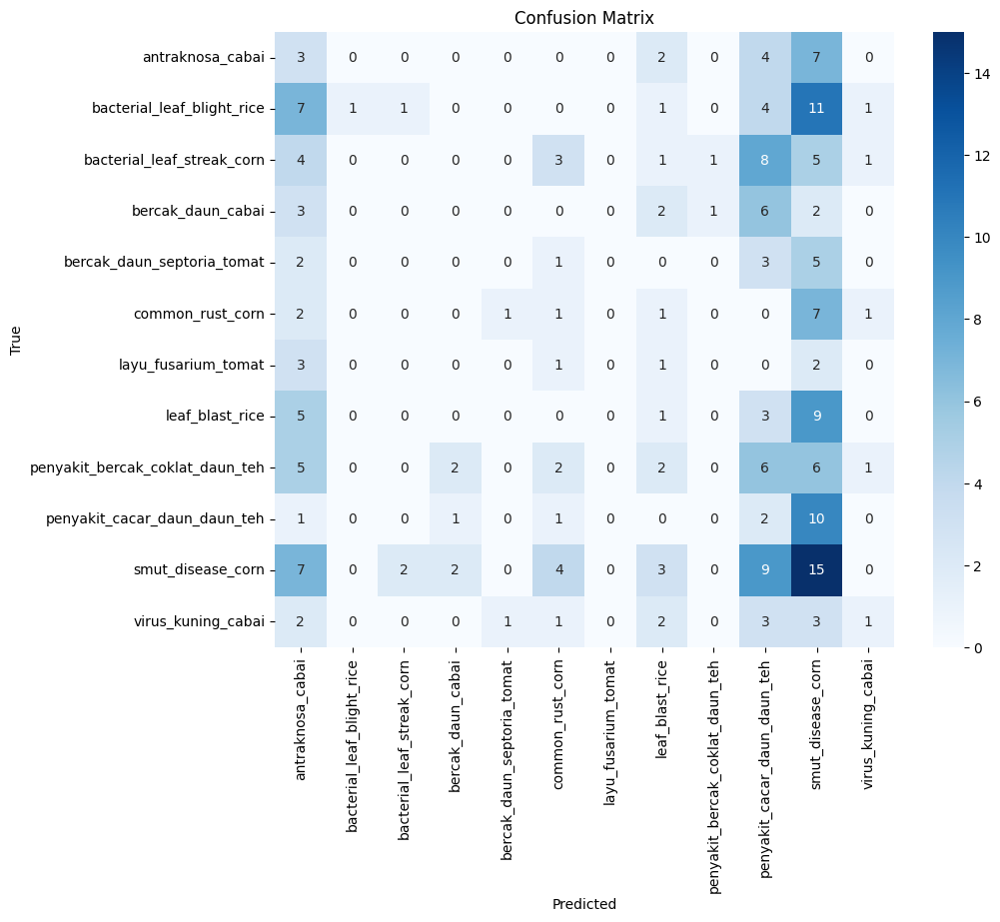

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report

# Prediksi kelas untuk data uji
y_pred = model.predict_generator(test_set)
y_pred_classes = np.argmax(y_pred, axis=1)

# True class labels
y_true = test_set.classes

# Mendapatkan nama kelas
class_names = list(test_set.class_indices.keys())

# Menghitung confusion matrix
conf_mat = confusion_matrix(y_true, y_pred_classes)

# Menampilkan classification report
print("Classification Report:\n", classification_report(y_true, y_pred_classes, target_names=class_names))

# Membuat heatmap confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()